### Economic Indicator Analysis

BACKGROUND OF DATA SET
The World Bank funds infrastructure projects in the developing world. As part of its mission, it releases an annual 
report on economic indicators. This dataset includes important indicators of economic performance and development 
from 1960-2018, including fields like electricity consumption, GDP per capita, life expectancy, and more.

To augment the World Bank data, Human Development Index (HDI) data has been provided by the United Nations (UN). 
HDI is a composite measure of how developed a country is based on life expectancy, GDP per capita, and educational attainment. 
This supplementary dataset contains additional indicators used by the UN to track development, environmental impact, and 
inequality for each country from 1990-2021.

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px

In [3]:
df = pd.read_csv('WorldBank.csv')

In [4]:
df.head()

,Country Name,Country Code,Region,IncomeGroup,Year,"Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)",Electric power consumption (kWh per capita),GDP (USD),GDP per capita (USD),Individuals using the Internet (% of population),"Infant mortality rate (per 1,000 live births)",Life expectancy at birth (years),Population density (people per sq. km of land area),Unemployment (% of total labor force) (modeled ILO estimate)
0,Afghanistan,AFG,South Asia,Low income,2018,NaN,NaN,NaN,1.936300e+10,520.897,NaN,47.9,NaN,56.9378,1.542
1,Afghanistan,AFG,South Asia,Low income,2017,33.211,6.575,NaN,2.019180e+10,556.302,13.50,49.5,64.130,55.5960,1.559
2,Afghanistan,AFG,South Asia,Low income,2016,33.981,6.742,NaN,1.936260e+10,547.228,11.20,51.2,63.763,54.1971,1.634
3,Afghanistan,AFG,South Asia,Low income,2015,34.809,6.929,NaN,1.990710e+10,578.466,8.26,53.1,63.377,52.7121,1.679
4,Afghanistan,AFG,South Asia,Low income,2014,35.706,7.141,NaN,2.048490e+10,613.856,7.00,55.1,62.966,51.1148,1.735


In [5]:
df.isna().sum()

Country Name                                                       0
Country Code                                                       0
Region                                                             0
IncomeGroup                                                        0
Year                                                               0
Birth rate, crude (per 1,000 people)                            1009
Death rate, crude (per 1,000 people)                            1033
Electric power consumption (kWh per capita)                     6601
GDP (USD)                                                       2871
GDP per capita (USD)                                            2874
Individuals using the Internet (% of population)                7385
Infant mortality rate (per 1,000 live births)                   2465
Life expectancy at birth (years)                                1273
Population density (people per sq. km of land area)              604
Unemployment (% of total labor for

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12449 entries, 0 to 12448
Data columns (total 15 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Country Name                                                  12449 non-null  object 
 1   Country Code                                                  12449 non-null  object 
 2   Region                                                        12449 non-null  object 
 3   IncomeGroup                                                   12449 non-null  object 
 4   Year                                                          12449 non-null  int64  
 5   Birth rate, crude (per 1,000 people)                          11440 non-null  float64
 6   Death rate, crude (per 1,000 people)                          11416 non-null  float64
 7   Electric power consumption (kWh per capita)                   5848 

In [12]:
#Clean the data by replacing NaN of each column affacted with the mean

df['Birth rate, crude (per 1,000 people)'].fillna(int(df['Birth rate, crude (per 1,000 people)'].mean()), inplace=True) 
df['Death rate, crude (per 1,000 people)'].fillna(int(df['Death rate, crude (per 1,000 people)'].mean()), inplace=True)
df['Electric power consumption (kWh per capita)'].fillna(int(df['Electric power consumption (kWh per capita)'].mean()), inplace=True) 
df['GDP (USD)'].fillna(int(df['GDP (USD)'].mean()), inplace=True) 
df['GDP per capita (USD)'].fillna(int(df['GDP per capita (USD)'].mean()), inplace=True) 
df['Individuals using the Internet (% of population)'].fillna(int(df['Individuals using the Internet (% of population)'].mean()), inplace=True) 
df['Infant mortality rate (per 1,000 live births)'].fillna(int(df['Infant mortality rate (per 1,000 live births)'].mean()), inplace=True) 
df['Life expectancy at birth (years)'].fillna(int(df['Life expectancy at birth (years)'].mean()), inplace=True) 
df['Population density (people per sq. km of land area)'].fillna(int(df['Population density (people per sq. km of land area)'].mean()), inplace=True) 
df['Unemployment (% of total labor force) (modeled ILO estimate)'].fillna(int(df['Unemployment (% of total labor force) (modeled ILO estimate)'].mean()), inplace=True) 

##### What are the unique regions present in the dataframe?

In [16]:


unique_regions = df['Region'].unique()
print(unique_regions)

['South Asia' 'Europe & Central Asia' 'Middle East & North Africa'
 'East Asia & Pacific' 'Sub-Saharan Africa' 'Latin America & Caribbean'
 'North America']


##### How many unique countries are included in the dataframe?

In [17]:


unique_countries_count = df['Country Name'].nunique()
print(unique_countries_count)


211


##### What is the average birth rate across all countries and years?

In [19]:


average_birth_rate = df['Birth rate, crude (per 1,000 people)'].mean()
print('The mean birth rate is',average_birth_rate)

The mean birth rate is 28.59113842477307
28.59113842477307


##### Birth rate by Country

In [90]:


df.groupby('Country Name').sum()['Birth rate, crude (per 1,000 people)'].sort_values(ascending = False)[:10]

Country Name
Niger          3187.783
Mali           2846.734
Angola         2844.693
Chad           2836.323
Uganda         2797.882
Afghanistan    2777.403
Yemen, Rep.    2775.204
Malawi         2750.836
Burundi        2736.823
Somalia        2716.181
Name: Birth rate, crude (per 1,000 people), dtype: float64

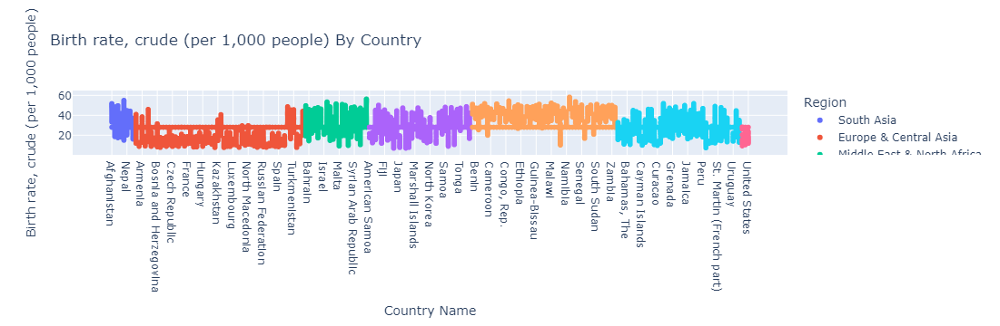

In [96]:
fig = px.scatter(df, x='Country Name', 
                 y='Birth rate, crude (per 1,000 people)', 
                 color='Region', title='Birth rate, crude (per 1,000 people) By Country')
fig.show()

##### Which country has the highest GDP per capita?


In [27]:

highest_gdp_country = df.loc[df['GDP per capita (USD)'].idxmax(), 'Country Name']
print('Country with highest GDP is', highest_gdp_country)

Country with highest GDP is Monaco


##### What is the total population density for each income group?

In [28]:


population_density_by_income = df.groupby('IncomeGroup')['Population density (people per sq. km of land area)'].sum()
print(population_density_by_income)


IncomeGroup
High income: OECD       2.554580e+05
High income: nonOECD    2.903785e+06
Low income              1.586482e+05
Lower middle income     2.987224e+05
Upper middle income     3.523714e+05
Name: Population density (people per sq. km of land area), dtype: float64


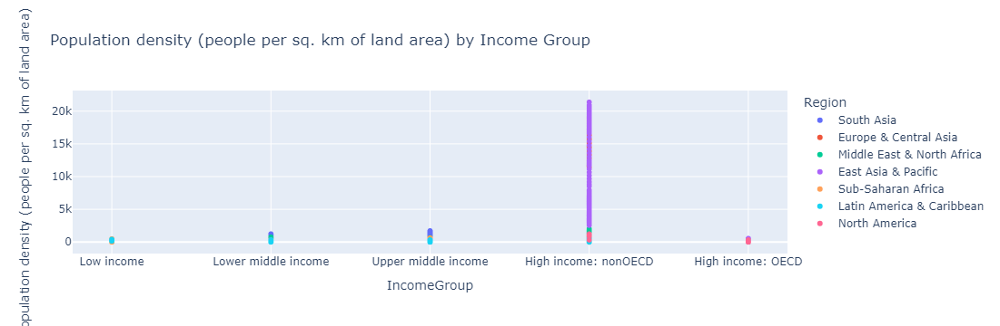

In [97]:
fig = px.scatter(df, x='IncomeGroup', 
                 y='Population density (people per sq. km of land area)', 
                 color='Region', title='Population density (people per sq. km of land area) by Income Group')
fig.show()

##### How does the internet usage (% of population) vary by Income Group?

In [101]:


Internet_Use_by_income_Group = df.groupby('IncomeGroup')['Individuals using the Internet (% of population)'].sum().sort_values(ascending = False)
print(Internet_Use_by_income_Group)

IncomeGroup
High income: nonOECD    78435.082621
Upper middle income     66875.623155
High income: OECD       64153.407054
Lower middle income     51252.419865
Low income              27304.228333
Name: Individuals using the Internet (% of population), dtype: float64


##### How does the internet usage (% of population) vary by Income Group?## #

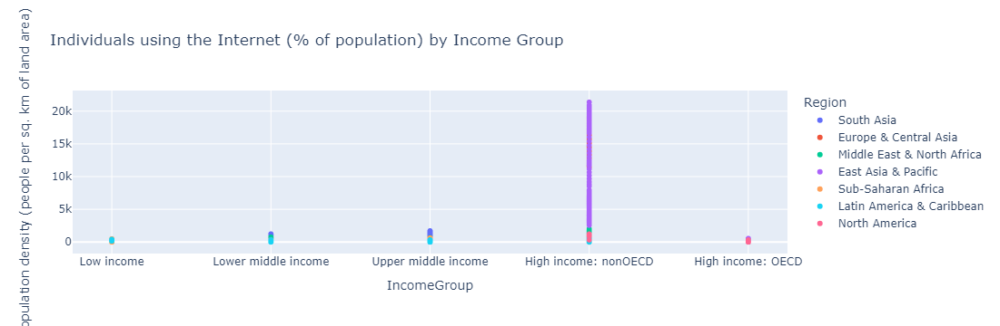

In [95]:


fig = px.scatter(df, x='IncomeGroup', 
                 y='Individuals using the Internet (% of population)', 
                 color='Region', title='Individuals using the Internet (% of population) by Income Group')
fig.show()

##### How does the internet usage (% of population) vary over the years? 

In [98]:


internet_usage_over_years = df.groupby('Year')['Individuals using the Internet (% of population)'].sum().sort_values(ascending = False)[:10]
print(internet_usage_over_years)

Year
2017    11371.16665
2016    10494.76440
2015    10000.54859
2014     9377.96644
2013     8825.58023
2018     8548.26379
2012     8248.72151
2011     7661.22722
2010     7093.71580
2009     6471.03239
Name: Individuals using the Internet (% of population), dtype: float64


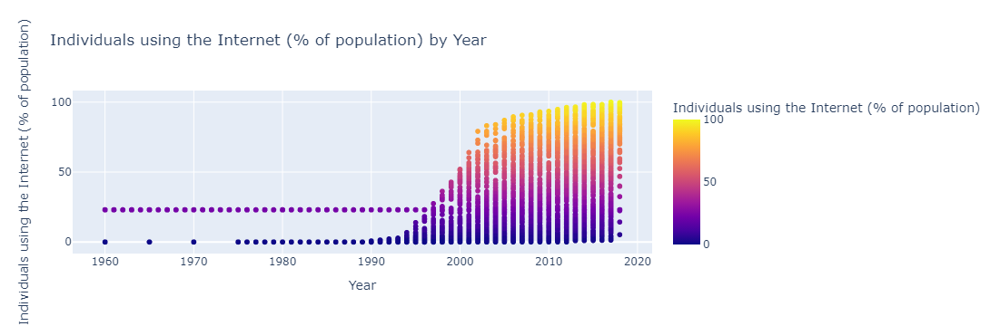

In [99]:
fig = px.scatter(df, x='Year', 
                 y='Individuals using the Internet (% of population)', 
                 color='Individuals using the Internet (% of population)', title='Individuals using the Internet (% of population) by Year')
fig.show()

In [36]:
internet_usage_over_years = df.groupby('Year')['Individuals using the Internet (% of population)'].mean().sort_values(ascending = False)[:10]
print(internet_usage_over_years)

Year
2017    53.891785
2016    49.738220
2015    47.395965
2014    44.445339
2013    41.827394
2018    40.513099
2012    39.093467
2011    36.309134
2010    33.619506
2009    30.668400
Name: Individuals using the Internet (% of population), dtype: float64


##### What is the correlation between GDP per capita and life expectancy?

In [39]:


correlation_gdp_life_expectancy = df['GDP per capita (USD)'].corr(df['Life expectancy at birth (years)'])
print(correlation_gdp_life_expectancy)


0.38597640022147844


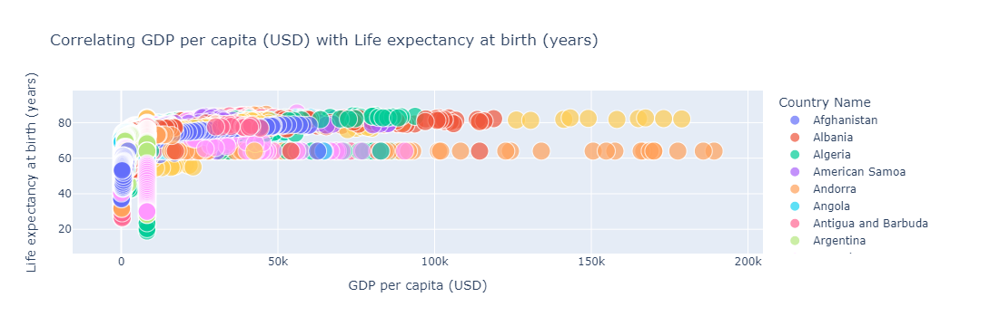

In [79]:
fig = px.scatter(df, x="GDP per capita (USD)", 
                 y="Life expectancy at birth (years)", 
                 color="Country Name", 
                 title='Correlating GDP per capita (USD) with Life expectancy at birth (years)',
                 size="Year", hover_data=["Region"])
fig.show()

##### Which region has the highest infant mortality rate?

In [44]:


highest_infant_mortality_region = df.loc[df.groupby('Region')['Infant mortality rate (per 1,000 live births)'].idxmax(), 'Region']
print(highest_infant_mortality_region)


1931            East Asia & Pacific
11386         Europe & Central Asia
4896      Latin America & Caribbean
12328    Middle East & North Africa
1239                  North America
57                       South Asia
9734             Sub-Saharan Africa
Name: Region, dtype: object


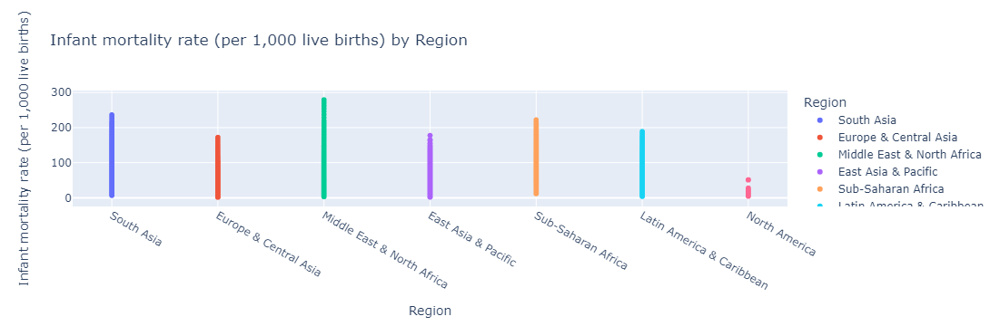

In [74]:
fig = px.scatter(df, x='Region', 
                 y='Infant mortality rate (per 1,000 live births)', 
                 color='Region', title='Infant mortality rate (per 1,000 live births) by Region')
fig.show()

##### What is the median unemployment rate across all countries?

In [72]:


median_unemployment_rate = df['Unemployment (% of total labor force) (modeled ILO estimate)'].median()
print('The median unemployment rate is :', median_unemployment_rate)


The median unemployment rate is : 8.0


##### How many countries fall under each income group?

In [45]:


countries_per_income_group = df.groupby('IncomeGroup')['Country Name'].nunique().sort_values(ascending = False)
print(countries_per_income_group)


IncomeGroup
Upper middle income     53
Lower middle income     48
High income: nonOECD    47
High income: OECD       32
Low income              31
Name: Country Name, dtype: int64


##### What is the average electric power consumption per capita for each income group?

In [70]:


avg_power_consumption_per_income = df.groupby('IncomeGroup')['Electric power consumption (kWh per capita)'].mean().sort_values(ascending = False)
print(avg_power_consumption_per_income)


IncomeGroup
High income: OECD       6332.141589
High income: nonOECD    3751.493914
Low income              2369.489024
Upper middle income     2351.047768
Lower middle income     1936.370264
Name: Electric power consumption (kWh per capita), dtype: float64


##### What is the average electric power consumption per capita for each income group?

In [68]:


avg_power_consumption_per_income = df.groupby('IncomeGroup')['Electric power consumption (kWh per capita)'].sum().sort_values(ascending = False)
print(avg_power_consumption_per_income)

IncomeGroup
High income: OECD       1.195508e+07
High income: nonOECD    1.040289e+07
Upper middle income     7.351726e+06
Lower middle income     5.483801e+06
Low income              4.333795e+06
Name: Electric power consumption (kWh per capita), dtype: float64


##### What is the average electric power consumption per capita for each income group?

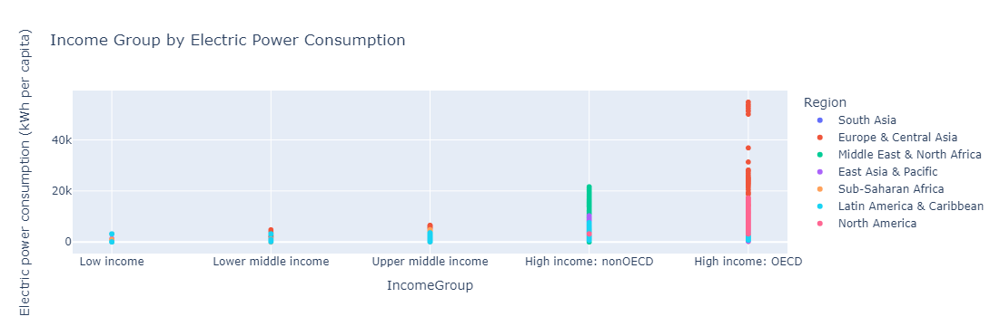

In [69]:


fig = px.scatter(df, x='IncomeGroup', 
                 y='Electric power consumption (kWh per capita)', 
                 color='Region', title='Income Group by Electric Power Consumption')
fig.show()

##### Is there any relationship between birth rate and death rate?

In [47]:


relationship_birth_death_rate = df['Birth rate, crude (per 1,000 people)'].corr(df['Death rate, crude (per 1,000 people)'])
print(relationship_birth_death_rate)


0.5867474143850087


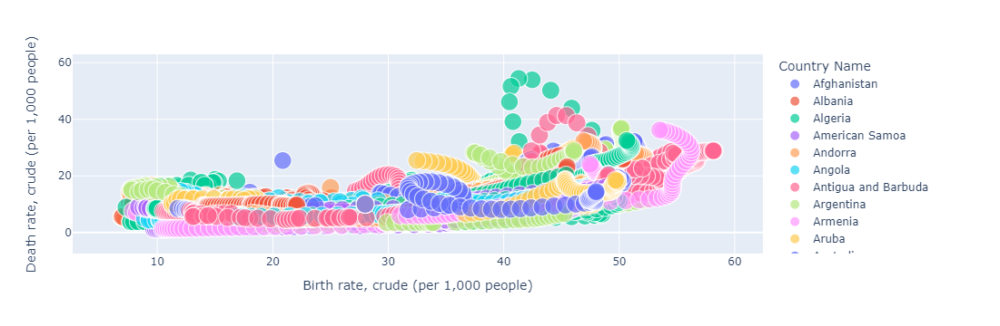

In [60]:
fig = px.scatter(df, x="Birth rate, crude (per 1,000 people)", 
                 y="Death rate, crude (per 1,000 people)", 
                 color="Country Name", 
                 size="Year", hover_data=["Region"])
fig.show()
